<a href="https://colab.research.google.com/github/DmitriiSednev/DLS/blob/main/Transfer_learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

 * Дообучил нейросети AlexNet, VGG16, ResNet с помощью Feature Extractor и fine tunning, визуализировал. Задача классификации изображений муравьев и пчел. Датасет из ~250 картинок муравьев и пчел

In [ ]:
# Установка необходимых библиотек
!pip install -q torchvision catalyst

# Импорт библиотек
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import time
import os
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 2.2 MB/s eta 0:00:00
Requested catalyst from https://files.pythonhosted.org/packages/05/09/36a4acd1c3112f2e2da74f4340778100a205ecb59166be00dc6287f3364f/catalyst-22.4-py2.py3-none-any.whl has invalid metadata: Expected matching RIGHT_PARENTHESIS for LEFT_PARENTHESIS, after version specifier
    scikit-image (<0.19.0>=0.16.1) ; extra == 'all'
                 ~~~~~~~~^
Please use pip<24.1 if you need to use this version.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.1/58.1 kB 4.3 MB/s eta 0:00:00
Requested catalyst from https://files.pythonhosted.org/packages/28/4f/380899b95b45f02182e7163b4e9be4749724c898886d70009168bfd07409/catalyst-22.2.1-py2.py3-none-any.whl has invalid metadata: Expected matching RIGHT_PARENTHESIS for LEFT_PARENTHESIS, after version specifier
    scikit-image (<0.19.0>=0.16.1) ; extra == 'all'
                 ~~~~~~~~^
Please use pip<24.1 if you need to use this version.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
import torch_xla
import torch_xla.core.xla_model as xm

ModuleNotFoundError: No module named 'torch_xla'

In [ ]:
# Загрузка данных
!wget https://download.pytorch.org/tutorial/hymenoptera_data.zip
!unzip hymenoptera_data.zip

--2025-02-03 17:00:06--  https://download.pytorch.org/tutorial/hymenoptera_data.zip
Resolving download.pytorch.org (download.pytorch.org)... 108.156.201.114, 108.156.201.90, 108.156.201.104, ...
Connecting to download.pytorch.org (download.pytorch.org)|108.156.201.114|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 47286322 (45M) [application/zip]
Saving to: ‘hymenoptera_data.zip’

hymenoptera_data.zi 100%[===================>]  45.10M   112MB/s    in 0.4s    

2025-02-03 17:00:07 (112 MB/s) - ‘hymenoptera_data.zip’ saved [47286322/47286322]

Archive:  hymenoptera_data.zip
   creating: hymenoptera_data/
   creating: hymenoptera_data/train/
   creating: hymenoptera_data/train/ants/
  inflating: hymenoptera_data/train/ants/0013035.jpg  
  inflating: hymenoptera_data/train/ants/1030023514_aad5c608f9.jpg  
  inflating: hymenoptera_data/train/ants/1095476100_3906d8afde.jpg  
  inflating: hymenoptera_data/train/ants/1099452230_d1949d3250.jpg  
  inflating: hymenopte

{'train': 244, 'val': 153}


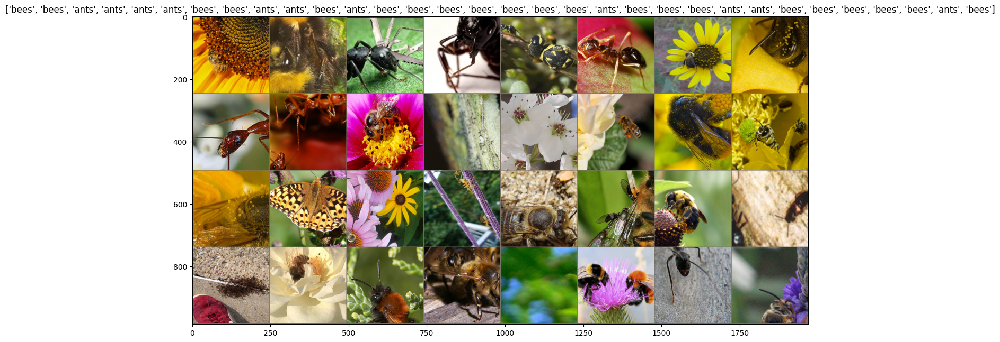

In [ ]:
# Преобразование данных
data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(244),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(244),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

# Загрузка данных
data_dir = './hymenoptera_data'
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x), data_transforms[x]) for x in ['train', 'val']}
train_dataloader = torch.utils.data.DataLoader(image_datasets["train"], batch_size=32, shuffle=True)
val_dataloader = torch.utils.data.DataLoader(image_datasets["val"], batch_size=128)

loaders = {
    "train": train_dataloader,
    "val": val_dataloader
}

dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}
class_names = image_datasets['train'].classes

print(dataset_sizes)

# Функция для отображения изображений
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.figure(figsize=(15, 12))
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)

# Получим 1 батч (картинки-метки) из обучающей выборки
inputs, classes = next(iter(loaders['train']))
out = torchvision.utils.make_grid(inputs)
imshow(out, title=[class_names[x] for x in classes])

In [ ]:
# Загрузка модели AlexNet
alexnet = models.alexnet(pretrained=True)

# Замена последнего слоя
alexnet.classifier[6] = nn.Linear(alexnet.classifier[6].in_features, 2)

# Заморозка всех слоев, кроме последнего
for param in alexnet.parameters():
    param.requires_grad = False
for param in alexnet.classifier[6].parameters():
    param.requires_grad = True

# Определение устройства (GPU или CPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
alexnet = alexnet.to(device)

# Оптимизатор и функция потерь
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(alexnet.parameters(), lr=0.001)

# Списки для хранения loss и accuracy
train_losses, val_losses, train_accuracies, val_accuracies = [], [], [], []

# Цикл обучения
for epoch in range(5):
    for phase in ['train', 'val']:
        if phase == 'train':
            alexnet.train()
        else:
            alexnet.eval()

        running_loss = 0.0
        running_corrects = 0

        for inputs, labels in loaders[phase]:
            inputs = inputs.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()

            with torch.set_grad_enabled(phase == 'train'):
                outputs = alexnet(inputs)
                _, preds = torch.max(outputs, 1)
                loss = criterion(outputs, labels)

                if phase == 'train':
                    loss.backward()
                    optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(preds == labels.data)

        epoch_loss = running_loss / dataset_sizes[phase]
        epoch_acc = running_corrects.double() / dataset_sizes[phase]

        if phase == 'train':
            train_losses.append(epoch_loss)
            train_accuracies.append(epoch_acc)
        else:
            val_losses.append(epoch_loss)
            val_accuracies.append(epoch_acc)

        print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


train Loss: 0.4800 Acc: 0.7705
val Loss: 0.2675 Acc: 0.8824
train Loss: 0.2969 Acc: 0.8811
val Loss: 0.2964 Acc: 0.9085
train Loss: 0.2265 Acc: 0.9139
val Loss: 0.3042 Acc: 0.9085
train Loss: 0.2264 Acc: 0.8975
val Loss: 0.3073 Acc: 0.9150
train Loss: 0.1876 Acc: 0.9139
val Loss: 0.3016 Acc: 0.9150


In [ ]:
def imshow(image, ax=None, resize=None):
    if resize is not None:
        image = transforms.Resize(resize)(image)
    if ax is None:
        fig, ax = plt.subplots()
    ax.imshow(image.permute(1, 2, 0))  # Предполагается, что image в формате CxHxW
    return ax

# Функция для удаления предупреждений при отображении изображения
import warnings
warnings.filterwarnings("ignore", category=UserWarning, module='matplotlib.image')

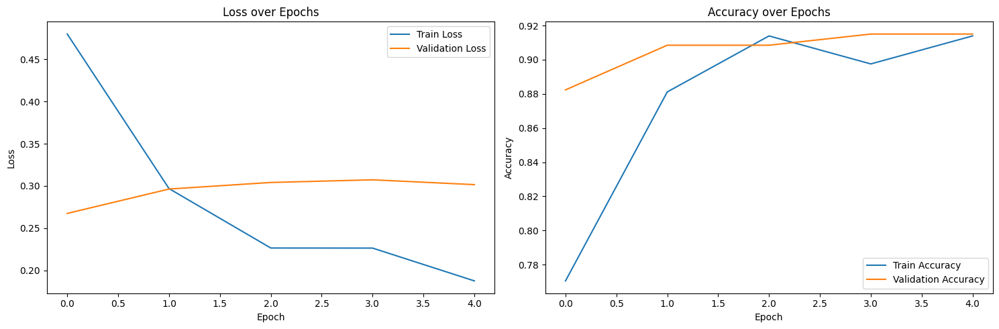

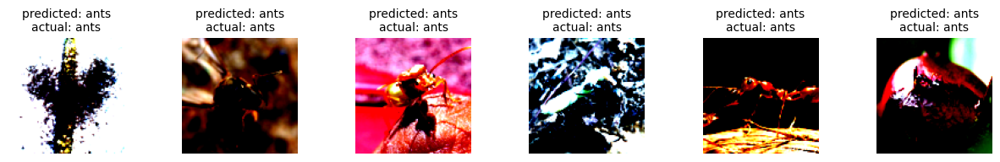

In [ ]:
# Графики Loss и Accuracy
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

# График Loss
axs[0].plot(train_losses, label='Train Loss')
axs[0].plot(val_losses, label='Validation Loss')
axs[0].set_xlabel('Epoch')
axs[0].set_ylabel('Loss')
axs[0].set_title('Loss over Epochs')
axs[0].legend()

# График Accuracy
axs[1].plot(train_accuracies, label='Train Accuracy')
axs[1].plot(val_accuracies, label='Validation Accuracy')
axs[1].set_xlabel('Epoch')
axs[1].set_ylabel('Accuracy')
axs[1].set_title('Accuracy over Epochs')
axs[1].legend()

plt.tight_layout()
plt.show()

# Визуализация результатов
def visualize_model(model, dataloader, class_names, num_images=6):
    model.eval()
    images_so_far = 0
    plt.figure(figsize=(15, 5))  # Уменьшаем размер для одной строки

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(1, num_images, images_so_far)  # Одной строкой
                ax.axis('off')
                ax.set_title(f'predicted: {class_names[preds[j]]}\nactual: {class_names[labels[j]]}', fontsize=10)

                # Измените размер изображений для корректной визуализации
                imshow(inputs.cpu().data[j], ax=ax, resize=(100, 100))  # Укажите нужный размер изображения

                plt.subplots_adjust(wspace=0.5)  # Увеличиваем расстояние между изображениями

                if images_so_far == num_images:
                    return

visualize_model(alexnet, loaders['val'], class_names)

* **Feature Extractor** способ:

 VGG16 с использованием Fine Tuning и mixed precision.

In [ ]:
from torch.cuda.amp import GradScaler, autocast
# Обучение VGG16
# Устройство
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Загрузка и подготовка модели VGG16
vgg16 = models.vgg16(pretrained=True)
num_features = 4096  # размерность вектора фич
vgg16.classifier[6] = nn.Linear(num_features, 2)  # Заменяем последний слой
vgg16 = vgg16.to(device)

# Оптимизатор
optimizer = optim.Adam(vgg16.parameters(), lr=1e-4)

# Инициализация mixed precision
scaler = GradScaler()

# Списки для хранения лоссов и точностей
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []

# Обучение VGG16
for epoch in range(5):
    for phase in ['train', 'val']:
        if phase == 'train':
            vgg16.train()
        else:
            vgg16.eval()

        running_loss = 0.0
        running_corrects = 0

        for inputs, labels in loaders[phase]:
            inputs = inputs.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()

            with torch.set_grad_enabled(phase == 'train'):
                with autocast():  # Используем mixed precision
                    outputs = vgg16(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = nn.CrossEntropyLoss()(outputs, labels)

                if phase == 'train':
                    scaler.scale(loss).backward()
                    scaler.step(optimizer)
                    scaler.update()

            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(preds == labels.data)

        epoch_loss = running_loss / dataset_sizes[phase]
        epoch_acc = running_corrects.double() / dataset_sizes[phase]

        print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

        # Сохраняем результаты для визуализации
        if phase == 'train':
            train_losses.append(epoch_loss)
            train_accuracies.append(epoch_acc.item())
        else:
            val_losses.append(epoch_loss)
            val_accuracies.append(epoch_acc.item())

<ipython-input-7-749ca9639c2e>:16: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()
<ipython-input-7-749ca9639c2e>:42: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # Используем mixed precision


train Loss: 0.4315 Acc: 0.8238
val Loss: 0.2360 Acc: 0.9477
train Loss: 0.2891 Acc: 0.8811
val Loss: 0.3355 Acc: 0.8889
train Loss: 0.2267 Acc: 0.9016
val Loss: 0.2302 Acc: 0.9412
train Loss: 0.1246 Acc: 0.9672
val Loss: 0.3398 Acc: 0.9346
train Loss: 0.1846 Acc: 0.9426
val Loss: 0.2650 Acc: 0.9216


In [ ]:
%reload_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

* **Feature Extractor** способ:

In [ ]:
! pip install catalyst[dl]


In [ ]:
Библиотека Catalist после Python 3.10 загружается/не загружается с ошибками, пробую обучать ручками

In [ ]:
model_extractor = models.inception_v3(pretrained=True)

In [ ]:
for param in model_extractor.parameters():
    print(param.requires_grad)
    break

True


{'train': 244, 'val': 153}


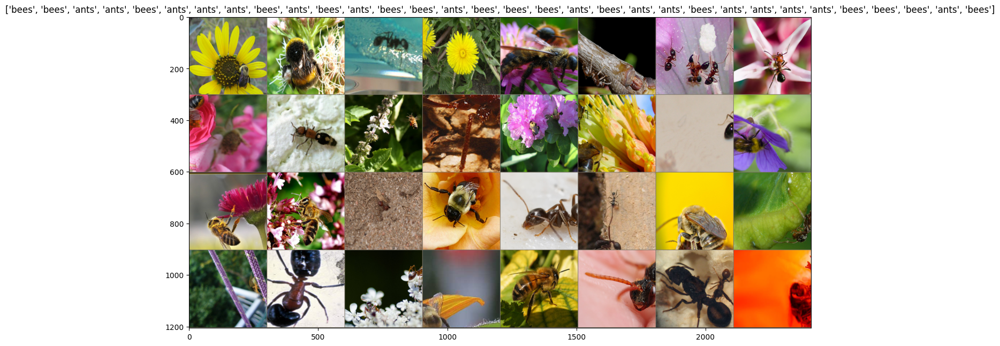

In [ ]:
# Преобразование данных
data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(299),  # Изменено на 299x299
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize(299),  # Изменено на 299x299
        transforms.CenterCrop(299),  # Изменено на 299x299
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

# Загрузка данных
data_dir = './hymenoptera_data'
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x), data_transforms[x]) for x in ['train', 'val']}
loaders = {
    'train': DataLoader(image_datasets['train'], batch_size=32, shuffle=True),
    'val': DataLoader(image_datasets['val'], batch_size=32, shuffle=False)
}

dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}
class_names = image_datasets['train'].classes

print(dataset_sizes)

# Функция для отображения изображений
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.figure(figsize=(15, 12))
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)

# Получим 1 батч (картинки-метки) из обучающей выборки
inputs, classes = next(iter(loaders['train']))
out = torchvision.utils.make_grid(inputs)
imshow(out, title=[class_names[x] for x in classes])

In [ ]:
# Загрузка модели Inception_v3
inception_v3 = models.inception_v3(pretrained=True)

# Feature Extractor: замораживаем все слои, кроме последнего
for param in inception_v3.parameters():
    param.requires_grad = False  # Feature Extractor: замораживаем слои
inception_v3.fc = nn.Linear(inception_v3.fc.in_features, 2)  # Заменяем последний слой
for param in inception_v3.fc.parameters():
    param.requires_grad = True  # Feature Extractor: размораживаем последний слой

# Перемещение модели на устройство
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
inception_v3 = inception_v3.to(device)

# Оптимизатор и функция потерь
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(inception_v3.fc.parameters(), lr=0.001)  # Feature Extractor: обучаем только последний слой

# Списки для хранения loss и accuracy
train_losses, val_losses, train_accuracies, val_accuracies = [], [], [], []

# Цикл обучения
for epoch in range(5):
    for phase in ['train', 'val']:
        if phase == 'train':
            inception_v3.train()  # Режим обучения
        else:
            inception_v3.eval()  # Режим валидации

        running_loss = 0.0
        running_corrects = 0

        for inputs, labels in loaders[phase]:
            inputs = inputs.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()

            with torch.set_grad_enabled(phase == 'train'):
                if phase == 'train':
                    outputs, aux_outputs = inception_v3(inputs)  # В режиме обучения два выхода
                else:
                    outputs = inception_v3(inputs)  # В режиме валидации один выход

                _, preds = torch.max(outputs, 1)
                loss = criterion(outputs, labels)

                if phase == 'train':
                    # Добавляем потери от вспомогательного выхода
                    aux_loss = criterion(aux_outputs, labels)
                    loss += 0.4 * aux_loss  # Коэффициент 0.4 для вспомогательного выхода

                    loss.backward()
                    optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(preds == labels.data)

        epoch_loss = running_loss / dataset_sizes[phase]
        epoch_acc = running_corrects.double() / dataset_sizes[phase]

        if phase == 'train':
            train_losses.append(epoch_loss)
            train_accuracies.append(epoch_acc)
        else:
            val_losses.append(epoch_loss)
            val_accuracies.append(epoch_acc)

        print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

train Loss: 3.9562 Acc: 0.5369
val Loss: 0.4949 Acc: 0.8170
train Loss: 3.8166 Acc: 0.7623
val Loss: 0.3967 Acc: 0.9150
train Loss: 3.7608 Acc: 0.7992
val Loss: 0.3403 Acc: 0.9216
train Loss: 3.6782 Acc: 0.8893
val Loss: 0.3216 Acc: 0.9085
train Loss: 3.6270 Acc: 0.8811
val Loss: 0.2917 Acc: 0.9150


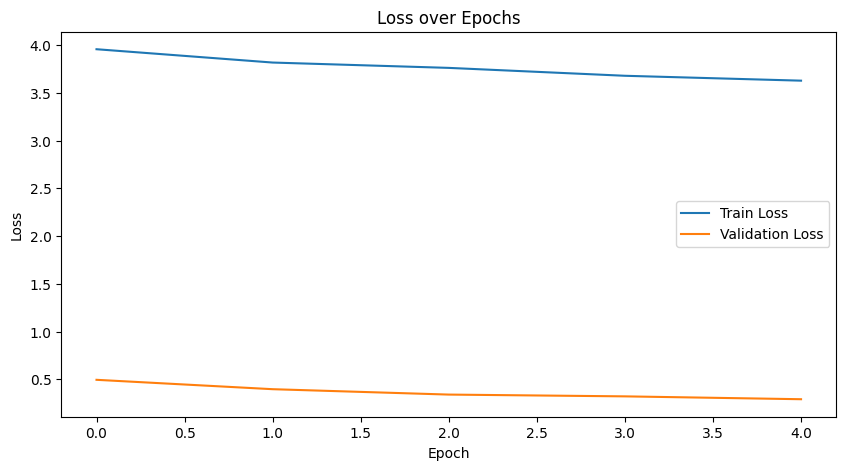

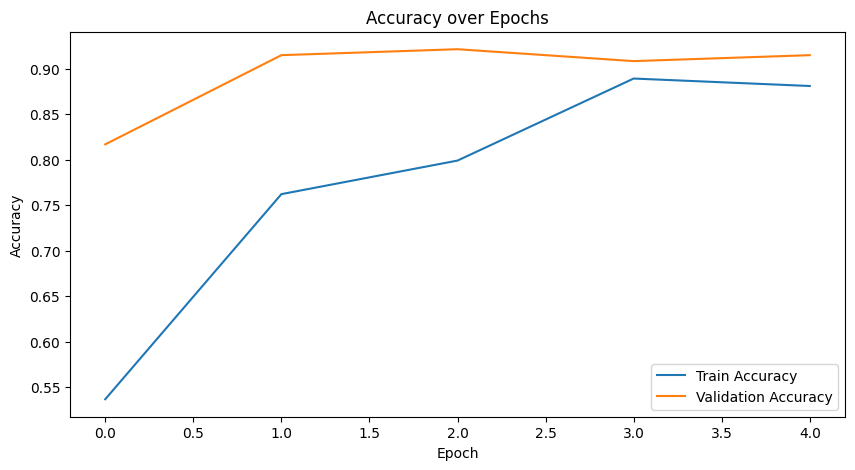

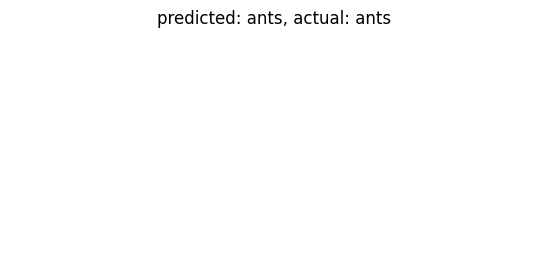

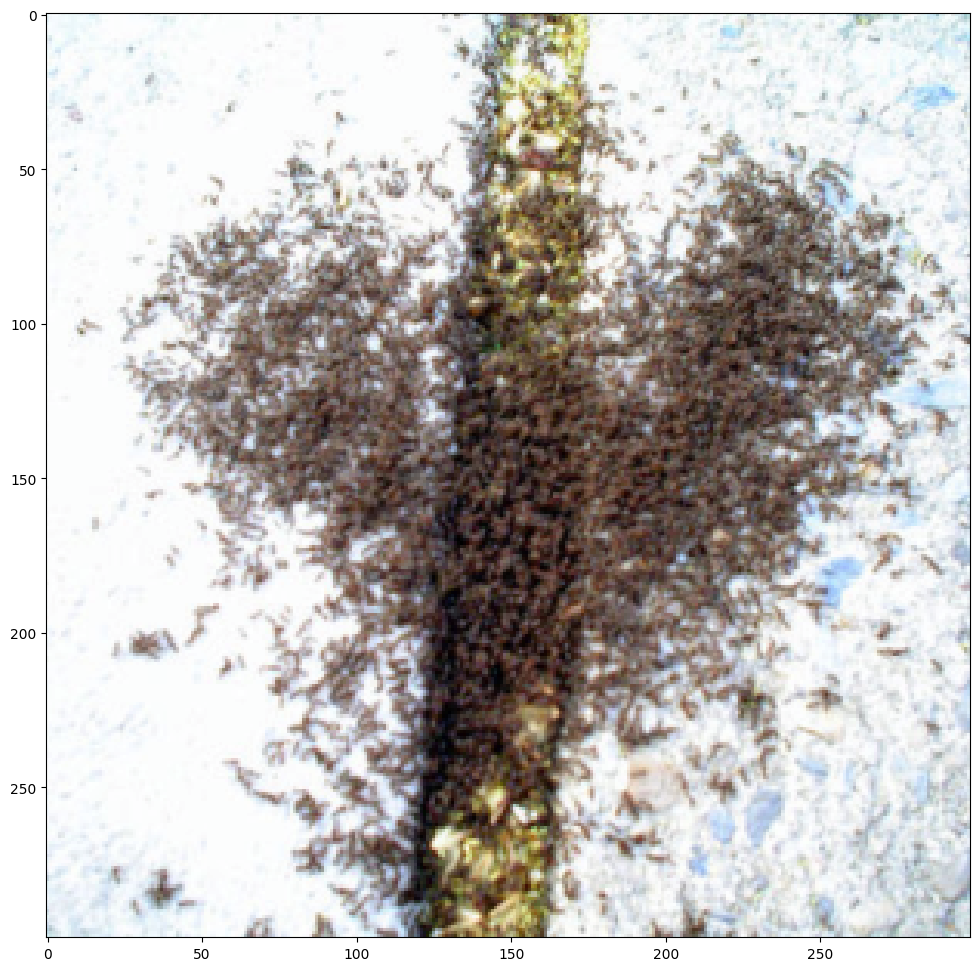

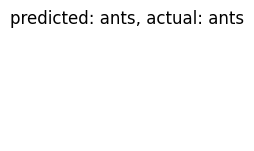

...

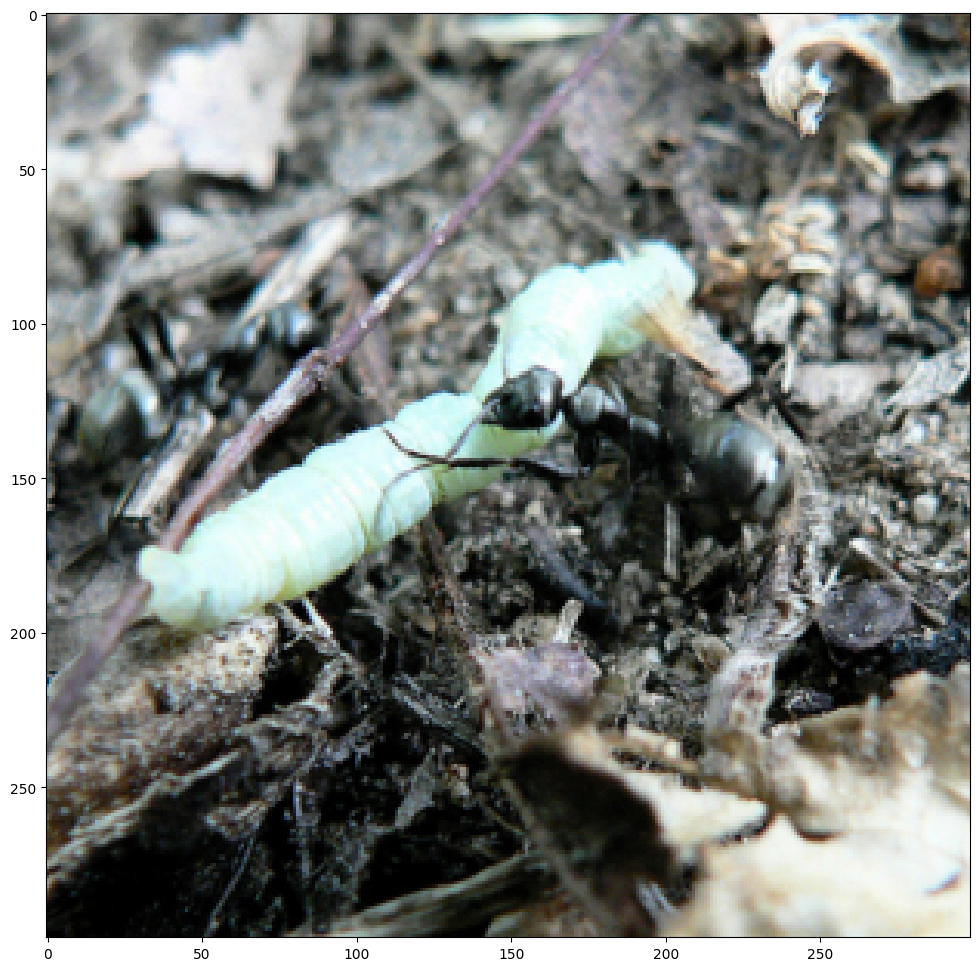

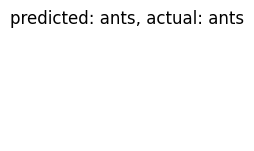

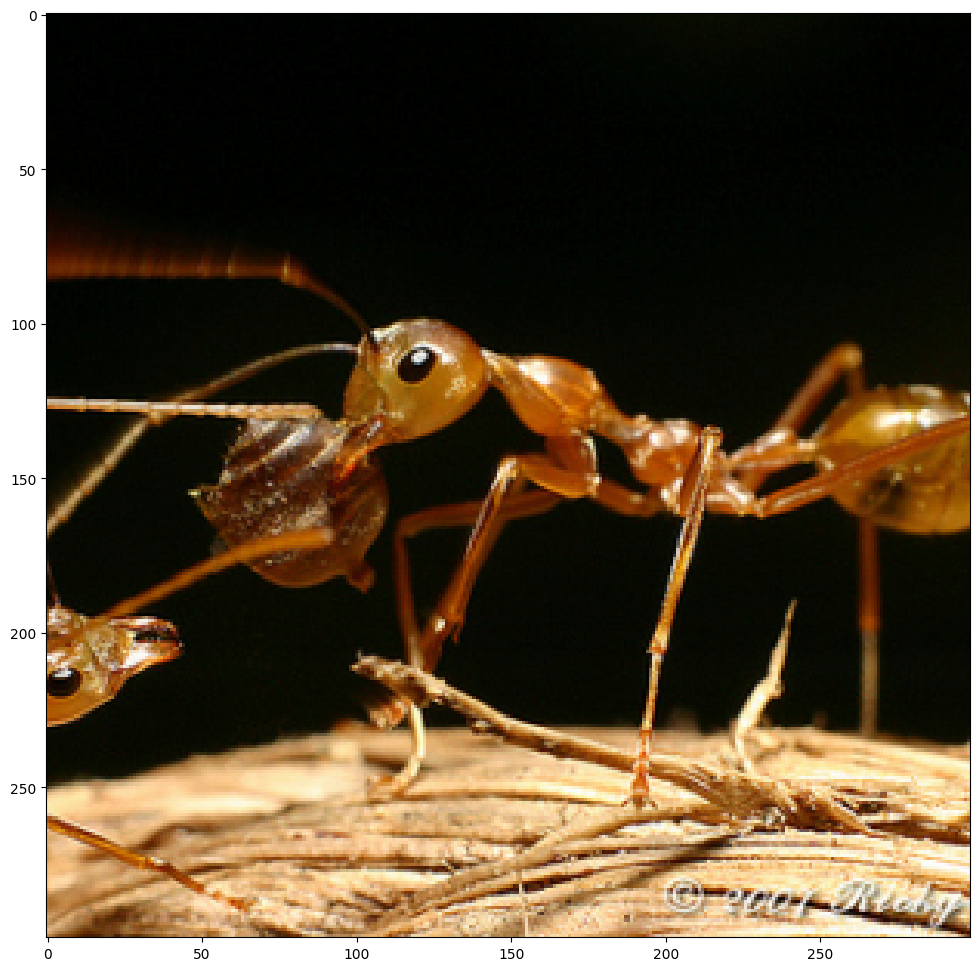

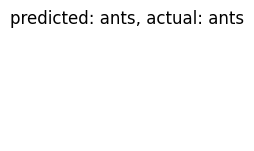

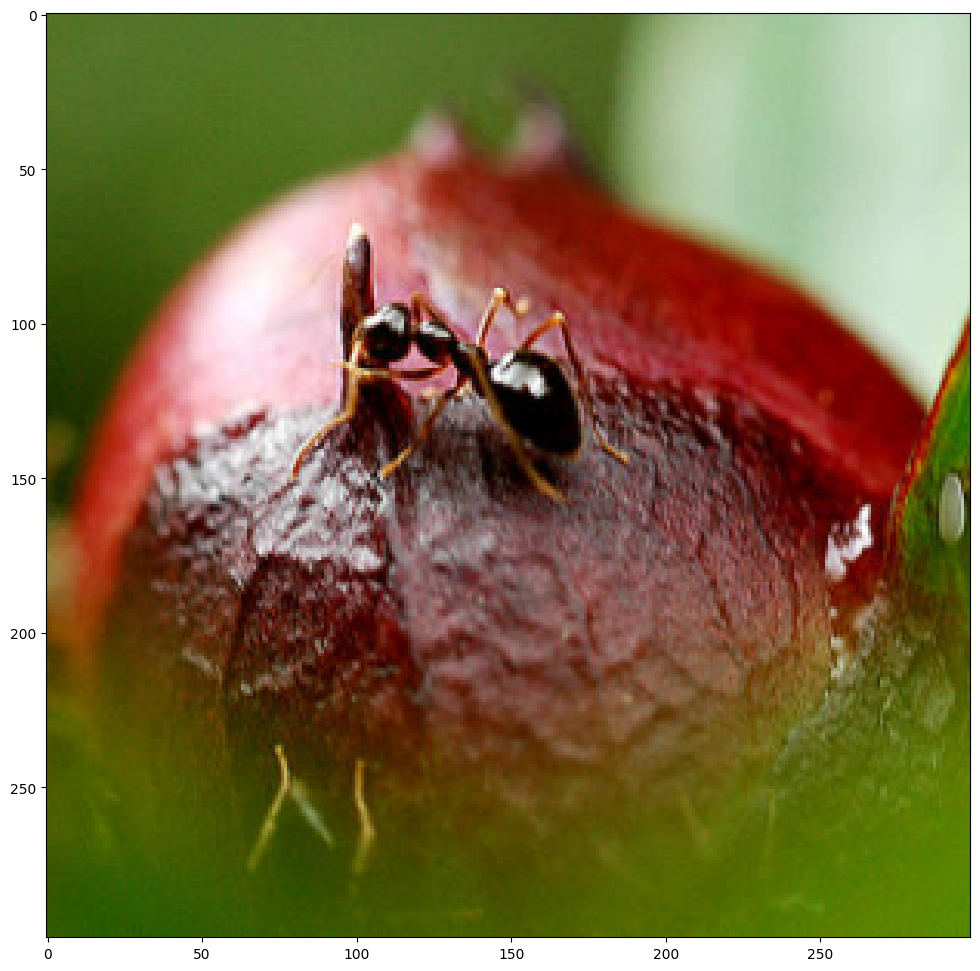

In [ ]:
# График Loss
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss over Epochs')
plt.legend()
plt.show()

# График Accuracy
plt.figure(figsize=(10, 5))
plt.plot(train_accuracies, label='Train Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy over Epochs')
plt.legend()
plt.show()

# Визуализация результатов
def visualize_model(model, dataloader, class_names, num_images=6):
    model.eval()
    images_so_far = 0
    plt.figure(figsize=(15, 10))

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images // 2, 2, images_so_far)
                ax.axis('off')
                ax.set_title(f'predicted: {class_names[preds[j]]}, actual: {class_names[labels[j]]}')
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    return

visualize_model(inception_v3, loaders['val'], class_names)

* **Смешанный** способ:
Мы будем обучать не только последний **fully connected** слой, но и несколько предпоследних

In [ ]:
from itertools import chain

In [ ]:
# Загрузка модели AlexNet
model_mixed = models.alexnet(pretrained=True)

# Количество слоёв, которые нужно разморозить
layers_to_unfreeze = 5

# Замораживаем все слои, кроме последних `layers_to_unfreeze` свёрточных слоёв и полносвязного слоя
for param in model_mixed.features[:-layers_to_unfreeze].parameters():
    param.requires_grad = False  # Замораживаем слои

# Заменяем последний полносвязный слой
num_features = model_mixed.classifier[6].in_features
model_mixed.classifier[6] = nn.Linear(num_features, 2)  # 2 класса: Муравьи и Пчёлы

# Перемещение модели на устройство
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_mixed = model_mixed.to(device)

# Оптимизатор: обучаем только последние `layers_to_unfreeze` свёрточных слоёв и полносвязный слой
optimizer = optim.Adam(
    chain(
        list(model_mixed.features.parameters())[-layers_to_unfreeze:],  # Последние слои features
        model_mixed.classifier.parameters()  # Все слои classifier
    ),
    lr=1e-4
)

# Функция потерь
criterion = nn.CrossEntropyLoss()

# Списки для хранения loss и accuracy
train_losses, val_losses, train_accuracies, val_accuracies = [], [], [], []

# Цикл обучения
for epoch in range(10):  # 10 эпох
    for phase in ['train', 'val']:
        if phase == 'train':
            model_mixed.train()
        else:
            model_mixed.eval()

        running_loss = 0.0
        running_corrects = 0

        for inputs, labels in loaders[phase]:
            inputs = inputs.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()

            with torch.set_grad_enabled(phase == 'train'):
                outputs = model_mixed(inputs)
                _, preds = torch.max(outputs, 1)
                loss = criterion(outputs, labels)

                if phase == 'train':
                    loss.backward()
                    optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(preds == labels.data)

        epoch_loss = running_loss / dataset_sizes[phase]
        epoch_acc = running_corrects.double() / dataset_sizes[phase]

        if phase == 'train':
            train_losses.append(epoch_loss)
            train_accuracies.append(epoch_acc)
        else:
            val_losses.append(epoch_loss)
            val_accuracies.append(epoch_acc)

        print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

train Loss: 0.4192 Acc: 0.8033
val Loss: 0.2964 Acc: 0.8824
train Loss: 0.2561 Acc: 0.8893
val Loss: 0.3801 Acc: 0.8954
train Loss: 0.2328 Acc: 0.9139
val Loss: 0.4038 Acc: 0.8824
train Loss: 0.2454 Acc: 0.9139
val Loss: 0.4036 Acc: 0.8889
train Loss: 0.1806 Acc: 0.9385
val Loss: 0.3678 Acc: 0.8954
train Loss: 0.1240 Acc: 0.9508
val Loss: 0.3555 Acc: 0.8954
train Loss: 0.1017 Acc: 0.9631
val Loss: 0.3810 Acc: 0.8889
train Loss: 0.0878 Acc: 0.9590
val Loss: 0.4248 Acc: 0.9020
train Loss: 0.1352 Acc: 0.9631
val Loss: 0.4394 Acc: 0.8954
train Loss: 0.1294 Acc: 0.9426
val Loss: 0.4481 Acc: 0.8889


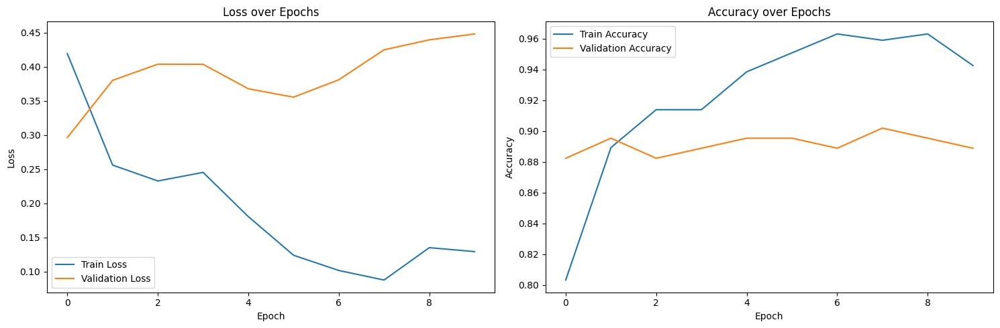

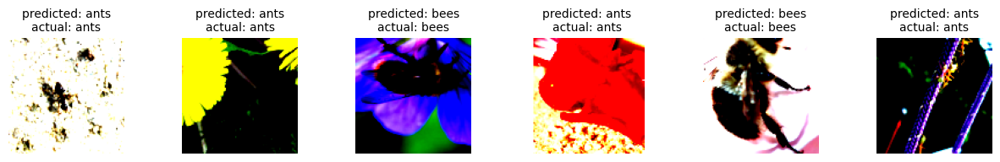

In [ ]:
# Графики Loss и Accuracy
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

# График Loss
axs[0].plot(train_losses, label='Train Loss')
axs[0].plot(val_losses, label='Validation Loss')
axs[0].set_xlabel('Epoch')
axs[0].set_ylabel('Loss')
axs[0].set_title('Loss over Epochs')
axs[0].legend()

# График Accuracy
axs[1].plot(train_accuracies, label='Train Accuracy')
axs[1].plot(val_accuracies, label='Validation Accuracy')
axs[1].set_xlabel('Epoch')
axs[1].set_ylabel('Accuracy')
axs[1].set_title('Accuracy over Epochs')
axs[1].legend()

plt.tight_layout()
plt.show()

# Визуализация результатов
def visualize_model(model, dataloader, class_names, num_images=6):
    model.eval()
    images_so_far = 0
    plt.figure(figsize=(15, 5))  # Уменьшаем размер для одной строки

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(1, num_images, images_so_far)  # Одной строкой
                ax.axis('off')
                ax.set_title(f'predicted: {class_names[preds[j]]}\nactual: {class_names[labels[j]]}', fontsize=10)

                # Измените размер изображений для корректной визуализации
                imshow(inputs.cpu().data[j], ax=ax, resize=(100, 100))  # Укажите нужный размер изображения

                plt.subplots_adjust(wspace=0.5)  # Увеличиваем расстояние между изображениями

                if images_so_far == num_images:
                    return

visualize_model(model_extractor, train_dataloader, class_names)

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, datasets, transforms
from torch.utils.data import DataLoader

# Функция для создания и настройки модели
def create_model(num_classes):
    model = models.resnet18(pretrained=True)  # Загрузка предобученной ResNet18
    for param in model.parameters():
        param.requires_grad = False  # Замораживаем все слои
    num_features = model.fc.in_features
    model.fc = nn.Linear(num_features, num_classes)  # Заменяем последний слой
    return model

# Задаем параметры
num_classes = 2  # 2 класса: Муравьи и Пчёлы
model_extractor = create_model(num_classes)

# Указываем устройство (GPU или CPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_extractor = model_extractor.to(device)

# Определяем оптимизатор и функцию потерь
optimizer = optim.Adam(model_extractor.fc.parameters(), lr=1e-3)  # Обучаем только последний слой
criterion = nn.CrossEntropyLoss()

# Подготовка данных для обучения и валидации
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Изменение размера изображений
    transforms.ToTensor(),  # Преобразование в тензор
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # Нормализация
])

# Загрузка данных
train_dataset = datasets.ImageFolder(root='./hymenoptera_data/train', transform=transform)
val_dataset = datasets.ImageFolder(root='./hymenoptera_data/val', transform=transform)

train_loader = DataLoader(dataset=train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(dataset=val_dataset, batch_size=32, shuffle=False)

# Функция для одной эпохи обучения
def train_one_epoch(model, loader, optimizer, criterion):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()  # Обнуление градиентов
        outputs = model(images)  # Прямой проход
        loss = criterion(outputs, labels)  # Вычисление потерь
        loss.backward()  # Обратный проход
        optimizer.step()  # Обновление параметров

        running_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    accuracy = 100 * correct / total
    return running_loss / len(loader), accuracy

# Функция для валидации модели
def validate(model, loader, criterion):
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)  # Прямой проход
            loss = criterion(outputs, labels)  # Вычисление потерь

            running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    accuracy = 100 * correct / total
    return running_loss / len(loader), accuracy

# Первый этап обучения: Feature Extractor
print("Первый этап: Обучение только последнего слоя")
for epoch in range(10):  # Количество эпох
    train_loss, train_accuracy = train_one_epoch(model_extractor, train_loader, optimizer, criterion)
    val_loss, val_accuracy = validate(model_extractor, val_loader, criterion)  # Валидация
    print(f'Epoch [{epoch+1}/10], Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%, Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.2f}%')

# Второй этап: Fine Tuning (дообучение всей модели)
print("\nВторой этап: Дообучение всей модели")
for param in model_extractor.parameters():
    param.requires_grad = True  # Размораживаем все слои

optimizer = optim.Adam(model_extractor.parameters(), lr=1e-4)  # Обучаем все слои

for epoch in range(10):  # Количество эпох
    train_loss, train_accuracy = train_one_epoch(model_extractor, train_loader, optimizer, criterion)
    val_loss, val_accuracy = validate(model_extractor, val_loader, criterion)  # Валидация
    print(f'Epoch [{epoch+1}/10], Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%, Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.2f}%')


Первый этап: Обучение только последнего слоя
Epoch [1/10], Train Loss: 0.6283, Train Accuracy: 62.30%, Val Loss: 0.4941, Val Accuracy: 75.82%
Epoch [2/10], Train Loss: 0.4483, Train Accuracy: 82.38%, Val Loss: 0.4066, Val Accuracy: 85.62%
Epoch [3/10], Train Loss: 0.3250, Train Accuracy: 91.80%, Val Loss: 0.3233, Val Accuracy: 90.20%
Epoch [4/10], Train Loss: 0.2690, Train Accuracy: 93.85%, Val Loss: 0.2995, Val Accuracy: 89.54%
Epoch [5/10], Train Loss: 0.2588, Train Accuracy: 92.62%, Val Loss: 0.2775, Val Accuracy: 89.54%
Epoch [6/10], Train Loss: 0.1857, Train Accuracy: 96.72%, Val Loss: 0.2612, Val Accuracy: 90.20%
Epoch [7/10], Train Loss: 0.1680, Train Accuracy: 95.49%, Val Loss: 0.2558, Val Accuracy: 89.54%
Epoch [8/10], Train Loss: 0.1760, Train Accuracy: 97.13%, Val Loss: 0.2543, Val Accuracy: 89.54%
Epoch [9/10], Train Loss: 0.1566, Train Accuracy: 95.90%, Val Loss: 0.2393, Val Accuracy: 91.50%
Epoch [10/10], Train Loss: 0.1910, Train Accuracy: 93.44%, Val Loss: 0.2325, Val A